In [2]:
import os
import sys
sys.path.append('./src') 
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
import yaml

from datasets import build_dataset, build_transforms
from denoiser import get_denoiser
from models import create_vae

import matplotlib.pyplot as plt 
import numpy as np

from backbones import get_backbone
from denoiser import get_denoiser, Denoiser
from models import create_vae, AutoencoderKL, create_emar_model, EncoderMAR, \
    get_unmasked_indices, ICLContextEncoder

In [51]:
dataset = "mvtec_ad"
category = "screw"
num_inference_steps = 100
device = 'cuda'
num_samples = 1
start_step = 64

In [52]:
from torch.utils.data import DataLoader
import torch

img_size = 256

normal_dataset = build_dataset(
    dataset_name=dataset,
    data_root = f"data/{dataset}",
    train=False,
    img_size=img_size,
    transform_type="default",
    category = category,
    normal_only = True
)
anom_dataset = build_dataset(
    dataset_name=dataset,
    data_root = f"data/{dataset}",
    train=False,
    img_size=img_size,
    transform_type="default",
    category = category,
    anom_only = True
)
print(len(normal_dataset))
print(len(anom_dataset))

41
119


In [53]:
log_dir = f"./results/ad_unet_vae/{category}"
config_path = os.path.join(log_dir, "config.yaml")
ckpt_path = os.path.join(log_dir, "model_latest.pth")

with open(config_path, 'r') as stream:
    try:
        config = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

seed = config['meta']['seed']
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed) 

config["diffusion"]["num_sampling_steps"] = str(num_inference_steps)
img_size = config['data']['img_size']
device = device
num_samples = num_samples

# build backbone model
backbone = create_vae(**config['vae'])
backbone.to(device).eval()

Working with z of shape (1, 16, 16, 16) = 4096 dimensions.
Loading pre-trained KL-VAE
Missing keys:
[]
Unexpected keys:
[]
Restored from ./weights/vae/kl16.ckpt


AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down): ModuleList(
      (0-1): 2 x Module(
        (block): ModuleList(
          (0-1): 2 x ResnetBlock(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
        )
        (attn): ModuleList()
        (downsample): Downsample(
          (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
        )
      )
      (2): Module(
        (block): ModuleList(
          (0): ResnetBlock(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
         

In [54]:
backbone_embed_dim = config['vae']['embed_dim']
backbone_stride = config['vae']['stride']
img_size = config['data']['img_size']
mim_in_sh = (backbone_embed_dim, img_size // backbone_stride, img_size // backbone_stride)

model: Denoiser = get_denoiser(**config['diffusion'], input_shape=mim_in_sh)
model_ckpt = torch.load(ckpt_path, map_location='cpu', weights_only=True)
results = model.load_state_dict(model_ckpt, strict=False)
print(results)
model.to(device).eval()

<All keys matched successfully>


Denoiser(
  (cls_embed): Embedding(15, 256)
  (net): UNetModel(
    (time_embed): Sequential(
      (0): Linear(in_features=256, out_features=1024, bias=True)
      (1): SiLU()
      (2): Linear(in_features=1024, out_features=1024, bias=True)
    )
    (input_blocks): ModuleList(
      (0): TimestepEmbedSequential(
        (0): Conv2d(16, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      )
      (1-2): 2 x TimestepEmbedSequential(
        (0): ResBlock(
          (in_layers): Sequential(
            (0): GroupNorm32(32, 256, eps=1e-05, affine=True)
            (1): SiLU()
            (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          )
          (h_upd): Identity()
          (x_upd): Identity()
          (emb_layers): Sequential(
            (0): SiLU()
            (1): Linear(in_features=1024, out_features=256, bias=True)
          )
          (out_layers): Sequential(
            (0): GroupNorm32(32, 256, eps=1e-05, affine=True)
           

In [55]:
from mask import RandomMaskCollator, BlockRandomMaskCollator, CheckerBoardMaskCollator, SlidingWindowMaskCollator, indices_to_mask, mask_to_indices
from datasets import EvalDataLoader
mask_strategy = "random"

# mask_ratio = conf ig['data']['mask']['ratio']
mask_ratio = 0.4
patch_size = 1
if mask_strategy == "random":
    mask_collator = RandomMaskCollator(
        ratio=mask_ratio, input_size=mim_in_sh[1], patch_size=patch_size, min_ratio=mask_ratio, max_ratio=mask_ratio
    )
elif mask_strategy == "block":
    kwargs = {
        "aspect_min": 0.75,
        "aspect_max": 1.5,
        "scale_min": 0.4,
        "scale_max": 0.7,
        "num_blocks": 2,
    }
    mask_collator = BlockRandomMaskCollator(
        input_size=mim_in_sh[1], patch_size=patch_size, mask_ratio=mask_ratio, **kwargs
    )
elif mask_strategy == "checkerboard":
    mask_collator = CheckerBoardMaskCollator(
        input_size=mim_in_sh[1], patch_size=patch_size, **config['data']['mask']
    )
elif mask_strategy == "sliding_window":
    mask_collator = SlidingWindowMaskCollator(
        input_size=mim_in_sh[1], patch_size=patch_size, **config['data']['mask']
    )
else:
    raise ValueError(f"Invalid mask strategy: {mask_strategy}")

bs = 8

# normal_dataloader = EvalDataLoader(normal_dataset, num_repeat=bs, collate_fn=mask_collator)
# anom_dataloader = EvalDataLoader(anom_dataset, num_repeat=bs, collate_fn=mask_collator)
normal_dataloader = DataLoader(normal_dataset, batch_size=bs, shuffle=False, num_workers=4, collate_fn=mask_collator, drop_last=False)
anom_dataloader = DataLoader(anom_dataset, batch_size=bs, shuffle=False, num_workers=4, collate_fn=mask_collator, drop_last=False)

In [355]:
len(anom_dataloader)

15

In [503]:
batch, mask_indices = list(iter(anom_dataloader))[2]
# batch, mask_indices = next(iter(normal_dataloader))
# ensure same mask for all samples
mask_indices = torch.stack([mask_indices[0] for _ in range(bs)])

num_patches = mim_in_sh[1] ** 2
mask = indices_to_mask(mask_indices, num_patches)
mask = mask.to(device)

mask_indices = mask_indices.to(device)
images = batch["samples"].to(device)
labels = batch["clslabels"].to(device)
gt_masks = batch["masks"]  # (B, 1, H, W) 
paths = batch["filenames"]
print(paths)

['data/mvtec_ad/screw/test/manipulated_front/016.png', 'data/mvtec_ad/screw/test/manipulated_front/017.png', 'data/mvtec_ad/screw/test/manipulated_front/018.png', 'data/mvtec_ad/screw/test/manipulated_front/019.png', 'data/mvtec_ad/screw/test/manipulated_front/020.png', 'data/mvtec_ad/screw/test/manipulated_front/021.png', 'data/mvtec_ad/screw/test/manipulated_front/022.png', 'data/mvtec_ad/screw/test/manipulated_front/023.png']


In [504]:
from einops import rearrange

@torch.no_grad()
def encode_images(x):
    post = backbone.encode(x)
    return post.sample().mul_(0.2325)

@torch.no_grad()
def decode_images(x):
    return backbone.decode(x / 0.2325)

def reshape_mask(m):  
    """ (B, hw) -> (B, hp, wp) """
    m = rearrange(m, 'b (h w) -> b h w', h=mim_in_sh[1], w=mim_in_sh[2])
    m = torch.repeat_interleave(m, repeats=patch_size, dim=1)
    m = torch.repeat_interleave(m, repeats=patch_size, dim=2)
    m = m.float()
    return m

### Unconditional Sampling

In [505]:
@torch.no_grad()
def sample(input_shape, labels, cond, mask_indices, strategy="ddim"):
    sample = model.sample(input_shape, labels, z=cond, mask_indices=mask_indices, strategy=strategy)  # (B, d, h, w)
    return sample

def postprocess(x):
    x = x / 2 + 0.5
    return x.clamp(0, 1)

def convert2image(x):
    if x.dim() == 3:
        return x.permute(1, 2, 0).cpu().numpy()
    elif x.dim() == 4:
        return x.permute(0, 2, 3, 1).cpu().numpy()
    else:
        return x.cpu().numpy()

in_sh = (bs, *mim_in_sh)
# in_sh = (bs, 3, 256, 256)
# preds = sample(in_sh, labels, cond=None, mask_indices=None)  # (B, d, h, w)
preds = sample(in_sh, labels, cond=None, mask_indices=None, strategy="org")  # (B, d, h, w)

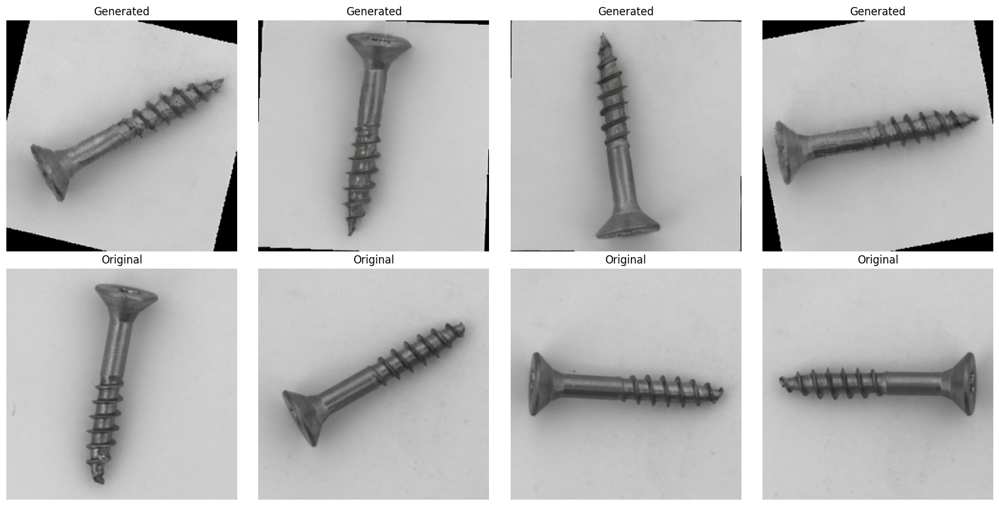

In [506]:
pred_imgs = decode_images(preds)  # (B, 3, H, W)
# pred_imgs = preds
pred_imgs = convert2image(postprocess(pred_imgs))  # (B, H, W, 3)
# pred_imgs = convert2image(pred_imgs)  # (B, H, W, 3)

fig, ax = plt.subplots(2, 4, figsize=(16, 8))
for i in range(4):
    ax[0, i].imshow(pred_imgs[i])
    ax[1, i].imshow(convert2image(postprocess(images))[i])
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[0, i].set_title("Generated")
    ax[1, i].set_title("Original")
plt.tight_layout()
plt.show()

### CCDF

In [507]:
import torch.nn.functional as F

def expand_bool_mask(m, p: int):
    # m: (B, h, w) 
    if p <= 0:
        return m
    m_float = m.float()  # (B, 1, h, w)
    dilated = F.max_pool2d(m_float, kernel_size=2*p+1, stride=1, padding=p)
    return dilated.squeeze(1) > 0

def gt_mask_to_mask(gt_mask, in_sh, expand_size):
    # gt_mask: (B, 1, H, W)
    gt_mask = expand_bool_mask(gt_mask, 3).unsqueeze(1).float()  # (B, 1, H, W)
    mask = F.interpolate(gt_mask, size=(in_sh[1], in_sh[2]), mode='nearest')
    mask = expand_bool_mask(mask, expand_size)
    return mask 

exp_size = 2
gt_masks_ = gt_masks.clone()
gt_masks_ = gt_mask_to_mask(gt_masks_, in_sh, expand_size=exp_size) # (B, h, w)
mask = gt_masks_.to(device)
mask = rearrange(mask, 'b h w -> b (h w)')
mask = reshape_mask(mask)

In [508]:
# mask = indices_to_mask(mask_indices, num_patches)
# mask = mask.to(device)  # (B, hw)
# mask = reshape_mask(mask)  # (B, h, w)

In [526]:
# Initialize x_T
x_T = torch.randn(in_sh).to(device)  # (B, d, h, w)

# indices = list(range(model.sample_diffusion.num_timesteps))[::-1]
cls_embed = model.cls_embed(labels)  # (B, Z)
model_kwargs = dict(c=cls_embed, z=None, mask_indices=None, z_vis=None)
sample_fn = model.net.forward

# Extract original latents
x_org = encode_images(images)  # (B, d, h, w)
inv_mask = 1 - mask.float() # (B, h, w)
mask, inv_mask = mask.unsqueeze(1), inv_mask.unsqueeze(1)  # (B, 1, h, w)

In [539]:
# CCDF Loop

from tqdm import tqdm

x = x_T
r = jump = 10

def generate_indices_with_jump(total_steps, r, jump):
    jumps = {}
    for j in range(0, total_steps - jump, jump):
        jumps[j] = r - 1
    
    t = total_steps - 1
    indices = []
    while t >= 1:
        t -= 1
        indices.append(t)
        
        if jumps.get(t, 0) > 0:
            jumps[t] -= 1
            for _ in range(r):
                t += 1
                indices.append(t)
    indices.append(0)
    return indices

indices = generate_indices_with_jump(num_inference_steps, r, jump)

prev_i = 0
for i in indices:
    t = torch.tensor([i] * bs).to(device)
    
    # If prev_i < i, then we diffuse x_{t}
    if prev_i < i:
        x = model.sample_diffusion.q_sample(x, t[0], noise=None)
        prev_i = i
        continue
    
    # Predict x_{t-1}^{unknown} from x_t
    with torch.no_grad():
        pred_x = model.sample_diffusion.p_sample(
            sample_fn,
            x,
            t,
            clip_denoised=False,
            denoised_fn=None,
            cond_fn=None,
            model_kwargs=model_kwargs,
            temperature=1.0,
        )["sample"]
    
    # sample x_{t-1}^{known} from x_vis
    vis_x = model.sample_diffusion.q_sample(
        x_org, t[0], noise=None
    )
    
    # composite x_{t-1}^{unknown} and x_{t-1}^{known}
    x = inv_mask * vis_x + mask * pred_x
    
    prev_i = i

In [540]:
# Show inpainting results
import torch.nn.functional as F

def show_repaint_results(x, mask, images):
    pred_imgs = decode_images(x)  # (B, 3, H, W)
    pred_imgs = convert2image(postprocess(pred_imgs))  # (B, H, W, 3)

    org_imgs = postprocess(images)  # (B, 3, H, W)
    reshaped_mask = F.interpolate(mask, size=(img_size, img_size), mode='nearest')  # (B, 1, H, W)
    masked_imgs = convert2image(org_imgs * (1 - reshaped_mask))  # (B, H, W, 3)

    fig, ax = plt.subplots(3, 4, figsize=(16, 12))
    for i in range(4):
        ax[0, i].imshow(pred_imgs[i])
        ax[1, i].imshow(masked_imgs[i])
        ax[2, i].imshow(convert2image(org_imgs)[i])
        ax[0, i].axis('off')
        ax[1, i].axis('off')
        ax[2, i].axis('off')
        ax[0, i].set_title("Inpainted")
        ax[1, i].set_title("Masked")
        ax[2, i].set_title("Original")
    plt.tight_layout()
    plt.show()

show_repaint_results(x, mask, images)

RuntimeError: The size of tensor a (7) must match the size of tensor b (8) at non-singleton dimension 0

In [512]:
def anomaly_map(x, y):
    anom_map = torch.mean((x - y)**2, dim=1)  # (B*K, h, w)
    anom_map = anom_map.view(-1, num_samples, in_sh[1], in_sh[2])  # (B, K, h, w)
    anom_map = torch.min(anom_map, dim=1).values # (B, h, w)
    return anom_map

In [513]:
model_kwargs = {
    'model_type': 'efficientnet-b4',
    'outblocks': (1, 5, 9, 21),
    'outstrides': (2, 4, 8, 16),
    'pretrained': True,
    'stride': 16
}
print(f"Using feature space reconstruction with {model_kwargs['model_type']} backbone")
feature_extractor = get_backbone(**model_kwargs)
feature_extractor.to(device).eval()

Using feature space reconstruction with efficientnet-b4 backbone


BackboneWrapper(
  (backbone): EfficientNet(
    (_conv_stem): Conv2dStaticSamePadding(
      3, 48, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d((0, 1, 0, 1))
    )
    (_bn0): BatchNorm2d(48, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          48, 48, kernel_size=(3, 3), stride=[1, 1], groups=48, bias=False
          (static_padding): ZeroPad2d((1, 1, 1, 1))
        )
        (_bn1): BatchNorm2d(48, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          48, 12, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_se_expand): Conv2dStaticSamePadding(
          12, 48, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_project_conv): Conv2dStaticSame

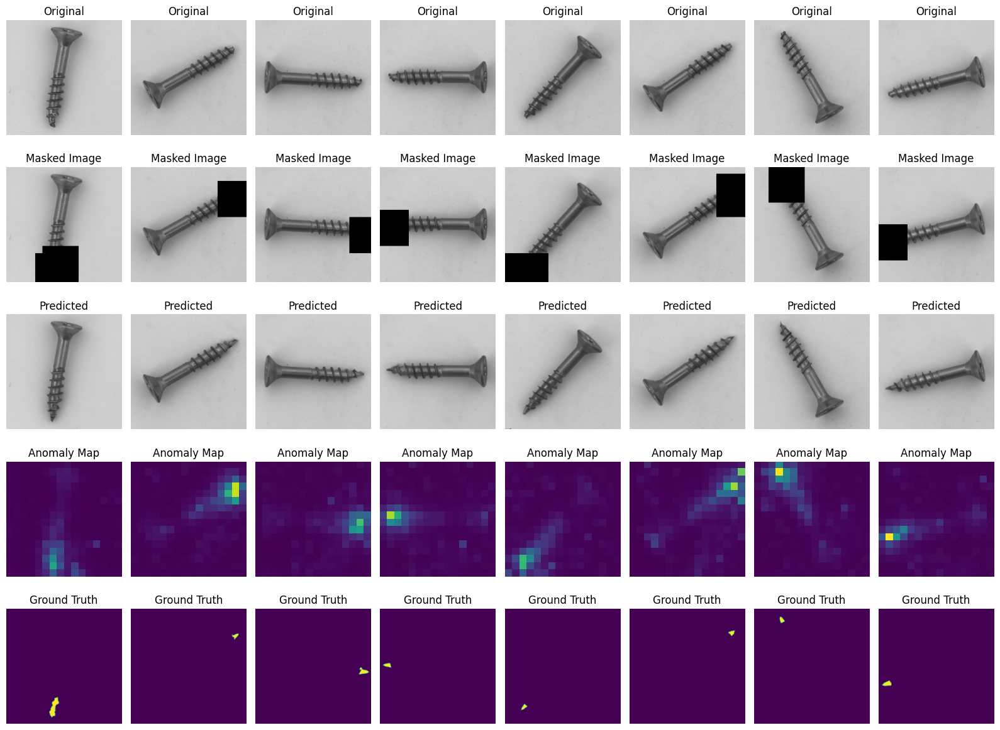

In [515]:
# Calculate anomaly score

def show_detection_results(x, mask, images, gt_masks, v_range=None):
    decoded_imgs = decode_images(x)

    with torch.no_grad():
        features = feature_extractor(images)
        decoded_features = feature_extractor(decoded_imgs)
        anom_map = anomaly_map(decoded_features, features)

    reshaped_mask = F.interpolate(mask, size=(img_size, img_size), mode='nearest')
    masked_imgs = convert2image(postprocess(images) * (1 - reshaped_mask))

    anom_map = anom_map.cpu().numpy()
    min_score = np.min(anom_map)
    max_score = np.max(anom_map)
    fig, ax = plt.subplots(5, bs, figsize=(16, 12))
    v_range = (min_score, max_score) if v_range is None else v_range
    for i in range(bs):
        ax[0, i].imshow(convert2image(postprocess(images[i])))
        ax[1, i].imshow(masked_imgs[i])
        ax[2, i].imshow(convert2image(postprocess(decoded_imgs[i])))
        ax[3, i].imshow(anom_map[i], vmin=v_range[0], vmax=v_range[1])
        ax[4, i].imshow(convert2image(gt_masks[i]))
        ax[0, i].set_title("Original")
        ax[1, i].set_title("Masked Image")
        ax[2, i].set_title("Predicted")
        ax[3, i].set_title("Anomaly Map")
        ax[4, i].set_title("Ground Truth")
        ax[0, i].axis('off')
        ax[1, i].axis('off')
        ax[2, i].axis('off')
        ax[3, i].axis('off')
        ax[4, i].axis('off')
        
    plt.tight_layout()
    plt.show()
    return min_score, max_score
    
v_range = show_detection_results(x, mask, images, gt_masks)

In [516]:
v_range

(0.049231812, 38.338997)

### Normal Mask Assignment

In [517]:
# Collect all abnormal features
abnormal_features = []
gt_masks_anom = []
abnormal_images = []

for batch, mask_indices in anom_dataloader:
    images = batch["samples"].to(device)
    gt_masks = batch["masks"]  # (B, 1, H, W)
    with torch.no_grad():
        features = feature_extractor(images)  # (B, C, H, W)
        # features = encode_images(images)
        features = torch.mean(features, dim=(2, 3))  # (B, C)
    
    for i in range(len(batch)):
        abnormal_images.append(images[i].cpu())
        abnormal_features.append(features[i].cpu())
        gt_masks_anom.append(gt_masks[i].cpu())

abnormal_images = torch.stack(abnormal_images)
abnormal_features = torch.stack(abnormal_features)
gt_masks_anom = torch.stack(gt_masks_anom)
print(abnormal_features.shape, gt_masks_anom.shape)

torch.Size([105, 272]) torch.Size([105, 1, 256, 256])


In [531]:
K = 3

batch_n, mask_indices_n = next(iter(normal_dataloader))
images_n = batch_n["samples"].to(device)
gt_masks_n = batch_n["masks"]  # (B, 1, H, W)
with torch.no_grad():
    features_n = feature_extractor(images_n)  # (B, C, H, W)
    # features_n = encode_images(images_n)
    features_n = torch.mean(features_n, dim=(2, 3))  # (B, C)
    features_n = features_n.cpu()
    
    # assign masks which belongs to top-k nearest neighbor anomalies
    dist = torch.cdist(features_n, abnormal_features, p=2)  # (B, N)
    _, indices = torch.topk(dist, K, largest=False, dim=1)  # (B, K)

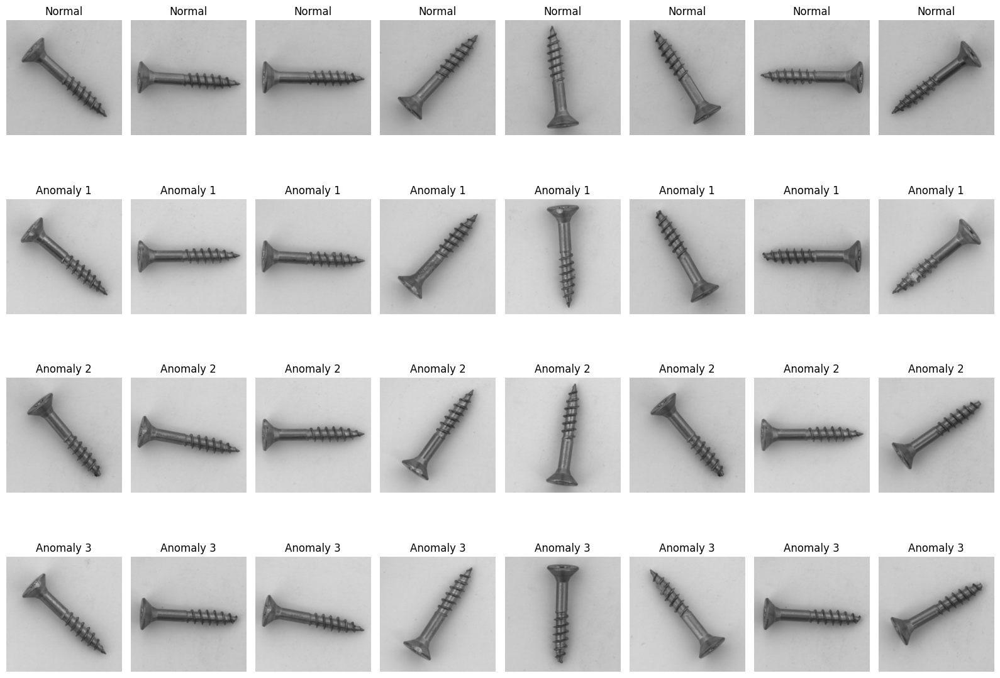

In [532]:
# visualize top-k nearest neighbor anomalies
fig, ax = plt.subplots(K+1, bs, figsize=(16, 12))
for i in range(bs):
    ax[0, i].imshow(convert2image(postprocess(images_n[i])))
    ax[0, i].set_title("Normal")
    ax[0, i].axis('off')
    for j in range(K):
        ax[j+1, i].imshow(convert2image(postprocess(abnormal_images[indices[i, j]])))
        ax[j+1, i].set_title(f"Anomaly {j+1}")
        ax[j+1, i].axis('off')
        
plt.tight_layout()
plt.show()

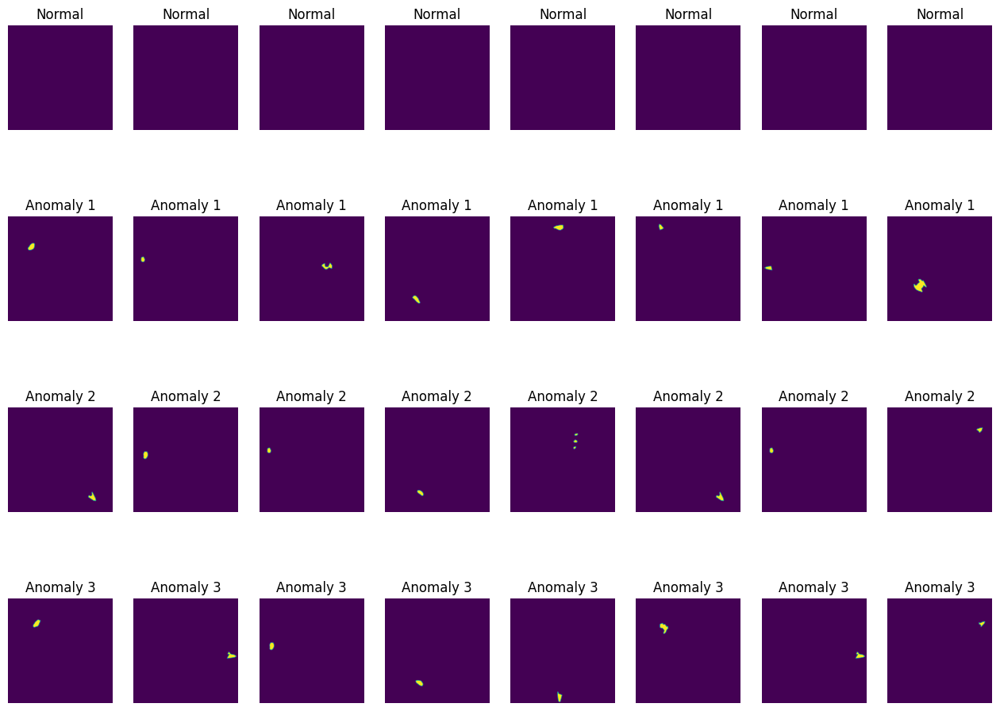

In [533]:
# Visualize assigned masks
fig, ax = plt.subplots(K+1, bs, figsize=(16, 12))

for i in range(bs):
    ax[0, i].imshow(convert2image(gt_masks_n[i]))
    ax[0, i].set_title("Normal")
    ax[0, i].axis('off')
    ms = []
    for j in range(K):
        ms.append(gt_masks_anom[indices[i, j]])
        ax[j+1, i].imshow(convert2image(gt_masks_anom[indices[i, j]]))
        ax[j+1, i].set_title(f"Anomaly {j+1}")
        ax[j+1, i].axis('off')
    m = torch.from_numpy(np.logical_or.reduce(ms))  # (H, W)
    gt_masks_n[i] = m.unsqueeze(0)

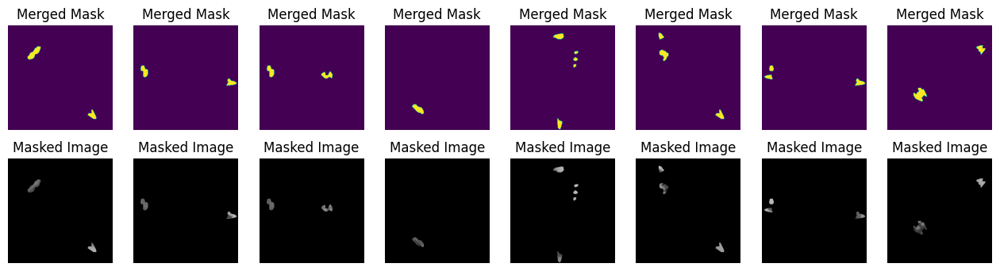

In [534]:
fig, ax = plt.subplots(2, bs, figsize=(16, 4))
for i in range(bs):
    ax[0, i].imshow(convert2image(gt_masks_n[i]))
    ax[1, i].imshow(convert2image(gt_masks_n[i] * postprocess(images_n[i].cpu())))
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[0, i].set_title("Merged Mask")
    ax[1, i].set_title("Masked Image")

In [535]:
gt_masks_ = gt_masks_n.clone()
gt_masks_ = gt_mask_to_mask(gt_masks_, in_sh, expand_size=exp_size) # (B, h, w)
mask = gt_masks_.to(device)
mask = rearrange(mask, 'b h w -> b (h w)')
mask = reshape_mask(mask)

# Initialize x_T
x_T = torch.randn(in_sh).to(device)  # (B, d, h, w)

indices = generate_indices_with_jump(num_inference_steps, r, jump)
# list(range(model.sample_diffusion.num_timesteps))[::-1]
cls_embed = model.cls_embed(labels)  # (B, Z)
model_kwargs = dict(c=cls_embed, z=None, mask_indices=None, z_vis=None)
sample_fn = model.net.forward

# Extract original latents
x_org = encode_images(images_n)  # (B, d, h, w)
inv_mask = 1 - mask.float() # (B, h, w)
mask, inv_mask = mask.unsqueeze(1), inv_mask.unsqueeze(1)  # (B, 1, h, w)

In [536]:
# CCDF Loop

from tqdm import tqdm

x = x_T
indices = tqdm(indices)

prev_i = 0
for i in indices:
    t = torch.tensor([i] * bs).to(device)
    
    # If prev_i < i, then we diffuse x_{t}
    if prev_i < i:
        x = model.sample_diffusion.q_sample(x, t[0], noise=None)
        prev_i = i
        continue
    
    # Predict x_{t-1}^{unknown} from x_t
    with torch.no_grad():
        pred_x = model.sample_diffusion.p_sample(
            sample_fn,
            x,
            t,
            clip_denoised=False,
            denoised_fn=None,
            cond_fn=None,
            model_kwargs=model_kwargs,
            temperature=1.0,
        )["sample"]
    
    # sample x_{t-1}^{known} from x_vis
    vis_x = model.sample_diffusion.q_sample(
        x_org, t[0], noise=None
    )
    
    # composite x_{t-1}^{unknown} and x_{t-1}^{known}
    x = inv_mask * vis_x + mask * pred_x
    
    prev_i = i

100%|██████████| 860/860 [00:09<00:00, 86.57it/s]


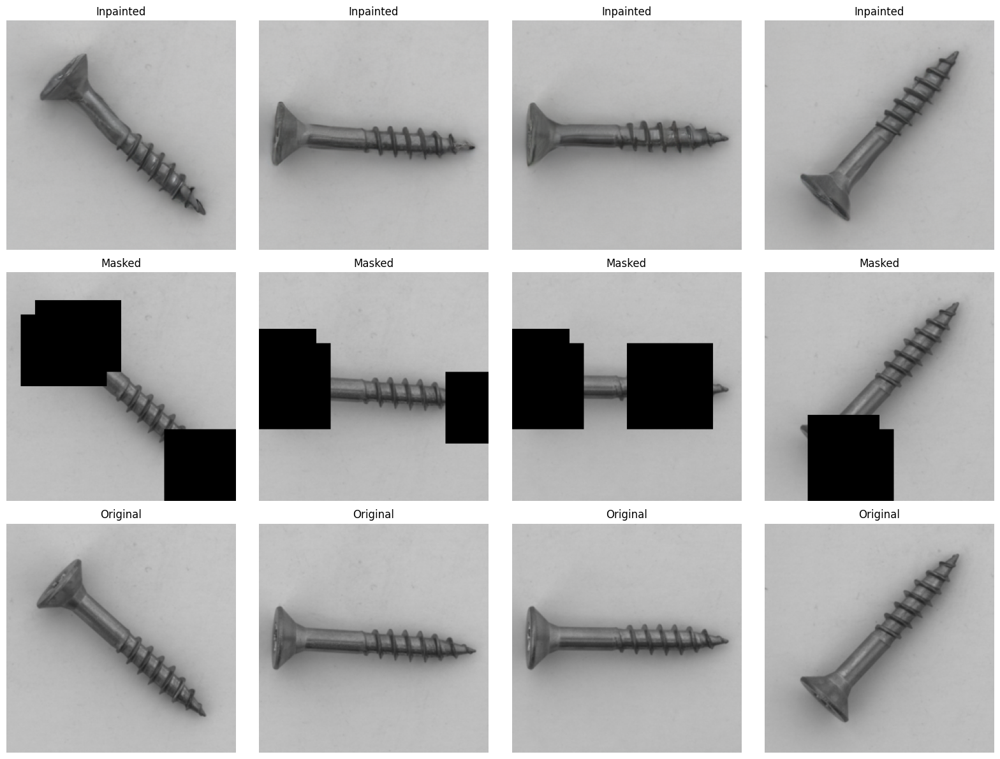

In [537]:
show_repaint_results(x, mask, images_n)

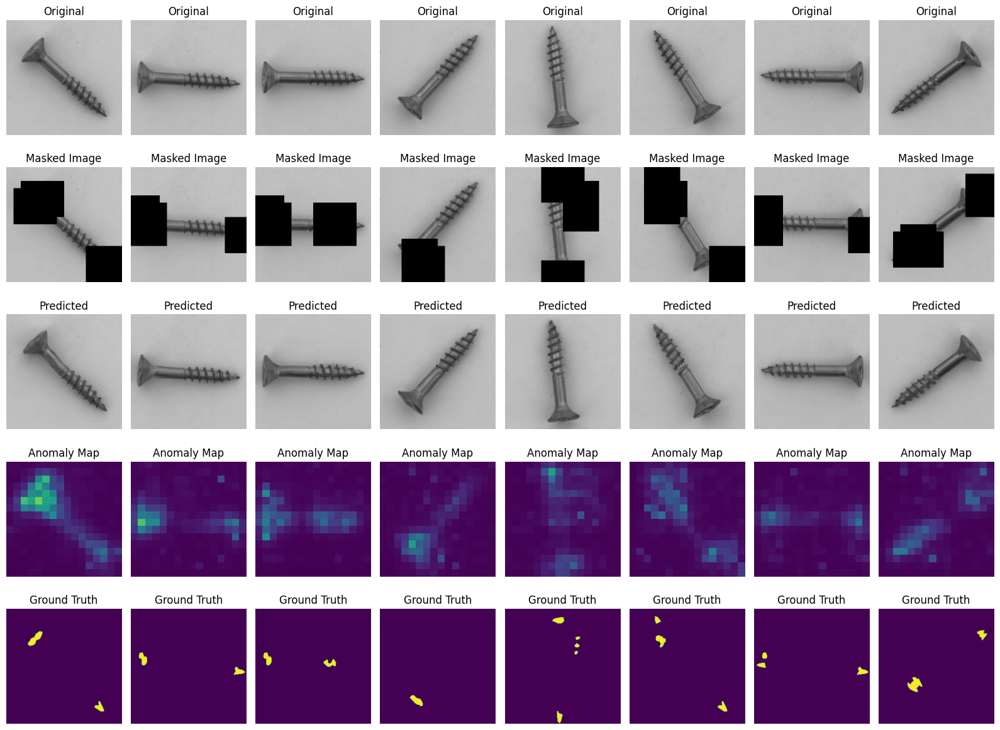

(0.06047568, 29.942255)

In [538]:
show_detection_results(x, mask, images_n, gt_masks_n, v_range=v_range)

### Repaint w/ resampling

In [472]:
r = jump = 2
indices = list(range(model.sample_diffusion.num_timesteps))[::-1]

# repeat each value in list by r times
def repeat_indices(indices, r):
    return [i for i in indices for _ in range(r)]

def generate_indices_with_jump(total_steps, r, jump):
    jumps = {}
    for j in range(0, total_steps - jump, jump):
        jumps[j] = r - 1
    
    t = total_steps - 1
    indices = []
    while t >= 1:
        t -= 1
        indices.append(t)
        
        if jumps.get(t, 0) > 0:
            jumps[t] -= 1
            for _ in range(r):
                t += 1
                indices.append(t)
    indices.append(0)
    return indices

indices = generate_indices_with_jump(num_inference_steps, r, jump)

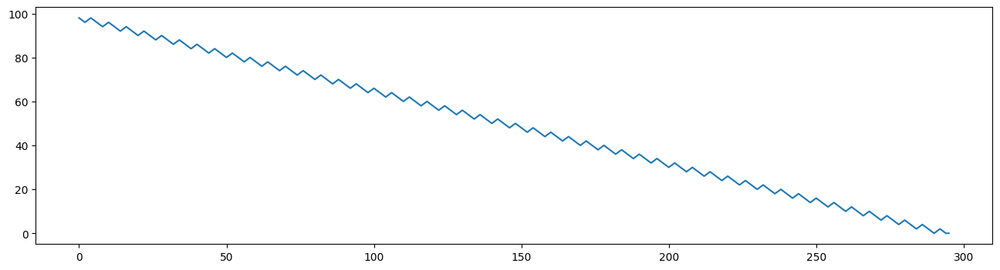

In [473]:
# Plot indices
fig, ax = plt.subplots(1, 1, figsize=(16, 4))
ax.plot(indices)

In [474]:
# Repaint Loop
from tqdm import tqdm

x = x_T
indices = tqdm(indices)

prev_i = 0
for i in indices:
    t = torch.tensor([i] * bs).to(device)
    
    # If prev_i < i, then we diffuse x_{t}
    if prev_i < i:
        x = model.sample_diffusion.q_sample(x, t[0], noise=None)
        prev_i = i
        continue
    
    # Predict x_{t-1}^{unknown} from x_t
    with torch.no_grad():
        pred_x = model.sample_diffusion.p_sample(
            sample_fn,
            x,
            t,
            clip_denoised=False,
            denoised_fn=None,
            cond_fn=None,
            model_kwargs=model_kwargs,
            temperature=1.0,
        )["sample"]
    
    # sample x_{t-1}^{known} from x_vis
    vis_x = model.sample_diffusion.q_sample(
        x_org, t[0], noise=None
    )
    
    # composite x_{t-1}^{unknown} and x_{t-1}^{known}
    x = inv_mask * vis_x + mask * pred_x
    
    prev_i = i

100%|██████████| 296/296 [00:04<00:00, 72.41it/s]


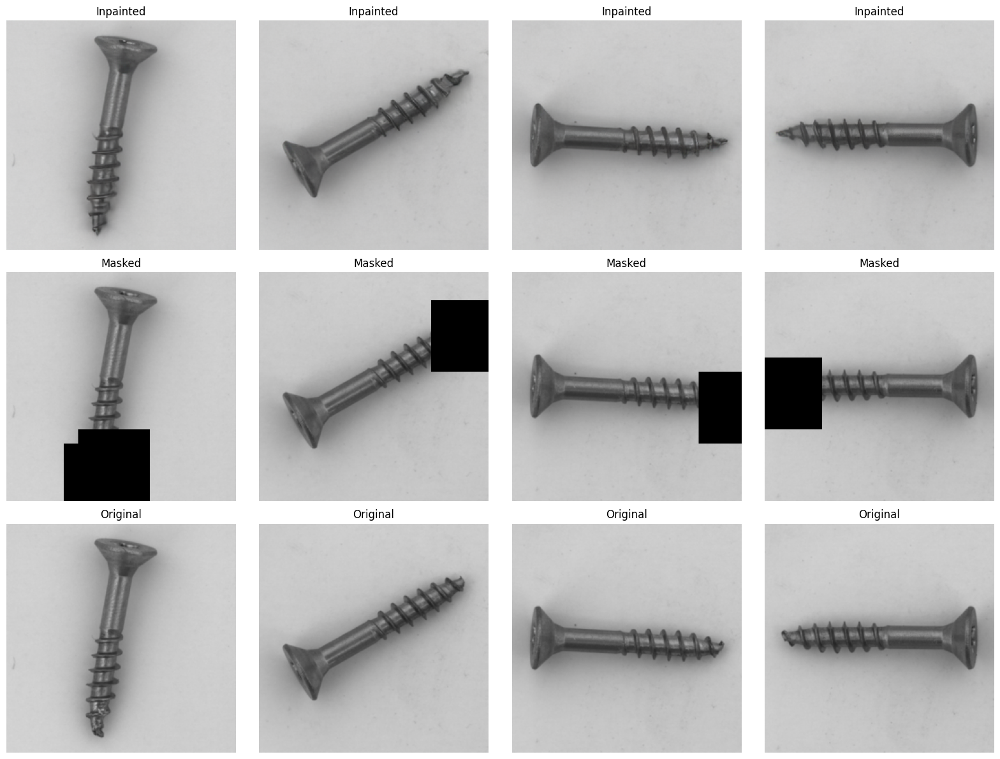

In [475]:
show_repaint_results(x, mask, images)

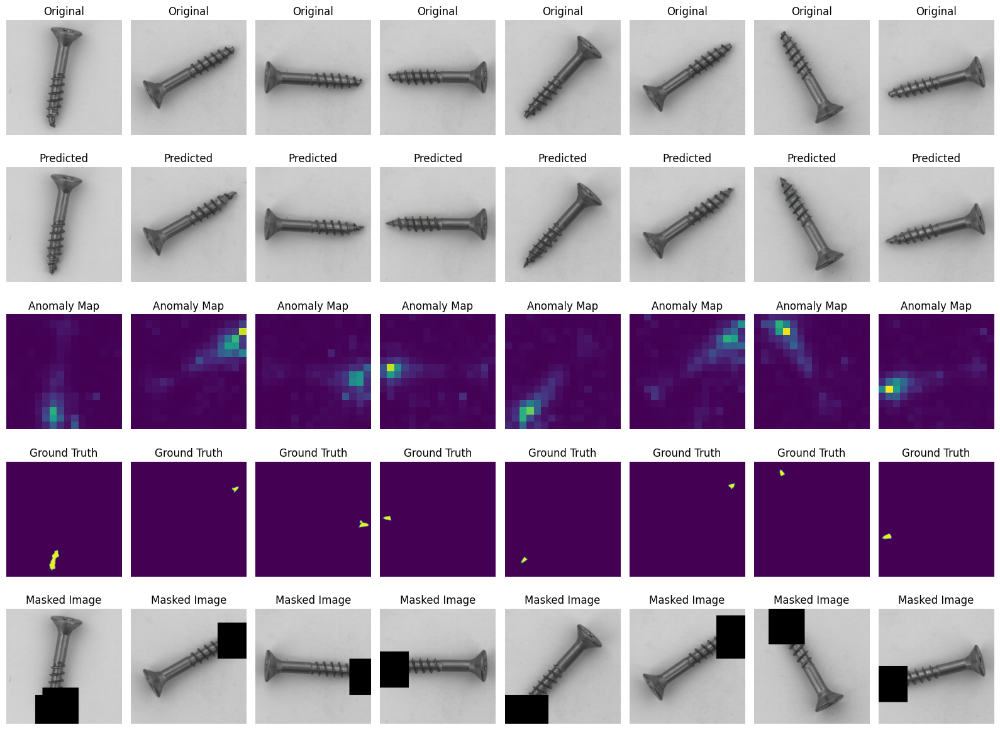

(0.058333866, 42.361507)

In [479]:
show_detection_results(x, mask, images, gt_masks)

### Hand-designed mask generation

In [32]:
%matplotlib widget
import matplotlib.pyplot as plt

In [33]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle

def create_interactive_grid(image_tensor, patch_size):
    """
    Displays an interactive grid of patches for the given image tensor.
    Clicking on a patch adds its (row, col) position to selected_patches list.
    
    Args:
        image_tensor: Input tensor in (C, H, W) format
        patch_size: Size of each square patch (p)
    
    Returns:
        fig, ax: Figure and axes objects for further customization
        selected_patches: List storing (row, col) of selected patches
    """
    # Convert tensor to numpy array and transpose to (H, W, C)
    image_np = image_tensor.cpu().numpy().transpose(1, 2, 0)
    
    # Normalize if image is in float format (assuming [0, 1] range)
    if np.issubdtype(image_np.dtype, np.floating):
        image_np = (image_np * 255).astype(np.uint8)
    
    H, W, _ = image_np.shape
    p = patch_size
    
    # Create figure and display image
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image_np, origin='upper')
    ax.set_title(f"Click to select {p}x{p} patches (Selected: 0)", pad=20)
    
    # Configure grid appearance
    ax.set_xticks(np.arange(0, W, p))
    ax.set_yticks(np.arange(0, H, p))
    ax.grid(which='both', color='white', linestyle='-', linewidth=0.5)
    ax.tick_params(axis='both', which='both', 
                   bottom=False, left=False,
                   labelbottom=False, labelleft=False)

    # Initialize list to store selected patches
    selected_patches = []
    
    # Create set to track drawn rectangles
    drawn_rectangles = set()

    def update_title():
        """Update the figure title with current selection count"""
        ax.set_title(f"Click to select {p}x{p} patches (Selected: {len(selected_patches)})", pad=20)
        fig.canvas.draw()

    def onclick(event):
        """Handle mouse click events"""
        if event.inaxes != ax:
            return
        
        x, y = event.xdata, event.ydata
        col = int(x // p)
        row = int(y // p)
        
        if 0 <= row < H//p and 0 <= col < W//p:
            # Check for duplicate selections
            if (row, col) not in drawn_rectangles:
                selected_patches.append((row, col))
                drawn_rectangles.add((row, col))
                
                # Draw selection rectangle
                rect = Rectangle((col*p, row*p), p, p, linewidth=2,
                                 edgecolor='lime', facecolor='none')
                ax.add_patch(rect)
                update_title()

    # Connect the click handler
    fig.canvas.mpl_connect('button_press_event', onclick)
    plt.show()
    
    return fig, ax, selected_patches

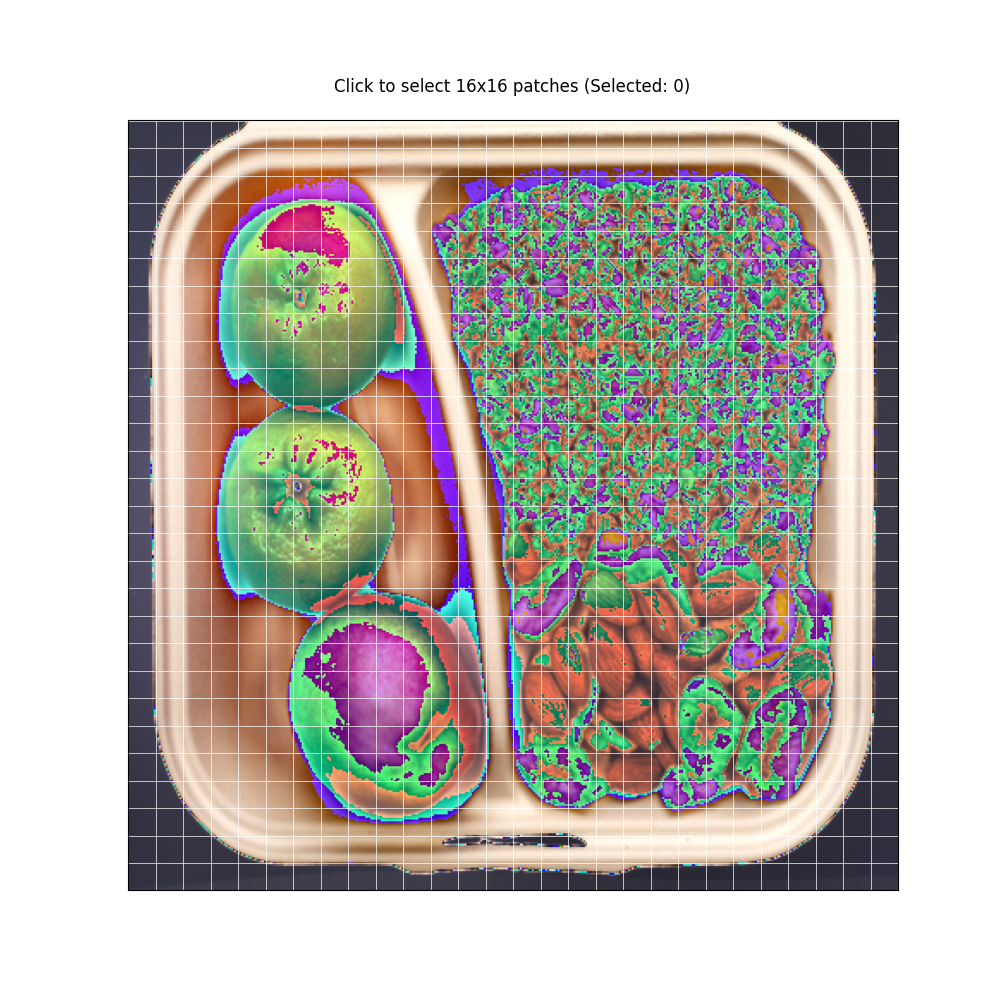

In [37]:
patch_size = 16
fig, ax, selected_patches = create_interactive_grid(images[0], patch_size)

In [38]:
print(selected_patches) # List of (row, col) positions

[(19, 22), (19, 23), (18, 22), (18, 23), (17, 23), (17, 22), (18, 14), (18, 15), (17, 14), (17, 15), (16, 15), (16, 14), (16, 17), (15, 17), (15, 18), (16, 19), (15, 19), (20, 20), (21, 20), (22, 20), (22, 21), (21, 21), (20, 21), (22, 23), (21, 23), (21, 25), (22, 24), (23, 24), (23, 23), (23, 22), (18, 24), (17, 24), (18, 25), (17, 25), (24, 16), (24, 15), (24, 14), (22, 14), (22, 15), (23, 16), (23, 15), (23, 14), (22, 16)]


In [39]:
from utils import ppos_to_pmask
trans_patches = [(y, x) for x, y in selected_patches]
mask_indices = torch.tensor(trans_patches).to(device).unsqueeze(0)
mask = ppos_to_pmask(mask_indices, mim_in_sh[1], mim_in_sh[2]).squeeze(1).to(device)  # (1, h, w)
mask

tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
          0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,

In [40]:
# Initialize x_T
x_T = torch.randn(in_sh).to(device)  # (B, d, h, w)

indices = generate_indices_with_jump(num_inference_steps, r, jump)
cls_embed = model.cls_embed(labels)  # (B, Z)
model_kwargs = dict(c=cls_embed, z=None, mask_indices=None, z_vis=None)
sample_fn = model.net.forward

# Extract original latents
x_org = encode_images(images)  # (B, d, h, w)
inv_mask = 1 - mask.float() # (B, h, w)
mask, inv_mask = mask.unsqueeze(1), inv_mask.unsqueeze(1)  # (B, 1, h, w)

In [41]:
# Repaint Loop
from tqdm import tqdm

x = x_T
indices = tqdm(indices)

prev_i = 0
for i in indices:
    t = torch.tensor([i] * bs).to(device)
    
    # If prev_i < i, then we diffuse x_{t}
    if prev_i < i:
        x = model.sample_diffusion.q_sample(x, t[0], noise=None)
        prev_i = i
        continue
    
    # Predict x_{t-1}^{unknown} from x_t
    with torch.no_grad():
        pred_x = model.sample_diffusion.p_sample(
            sample_fn,
            x,
            t,
            clip_denoised=False,
            denoised_fn=None,
            cond_fn=None,
            model_kwargs=model_kwargs,
            temperature=1.0,
        )["sample"]
    
    # sample x_{t-1}^{known} from x_vis
    vis_x = model.sample_diffusion.q_sample(
        x_org, t[0], noise=None
    )
    
    # composite x_{t-1}^{unknown} and x_{t-1}^{known}
    x = inv_mask * vis_x + mask * pred_x
    
    prev_i = i

100%|██████████| 2980/2980 [00:48<00:00, 61.37it/s]


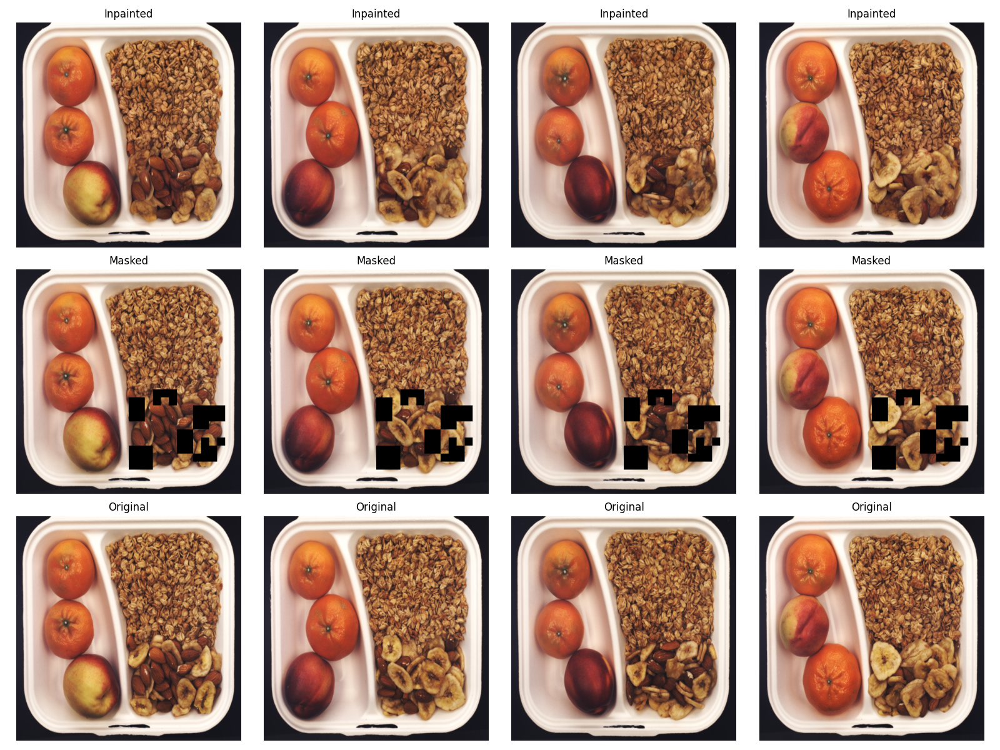

In [44]:
show_repaint_results(x, mask, images)